# Math 607 HW 3
### Sean Ericson 5/26/2024

In [13]:
# Imports
import numpy as np
import scipy.stats
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import LightSource
from IPython.display import Image

mpl.rcParams['figure.dpi'] = 250
mpl.rcParams['text.usetex'] = True
mpl.rcParams['text.latex.preamble'] = r'\usepackage{amsmath,amsfonts,physics}'

## Graph Transformations

### a)
 Because a perfect matching must contain every vertex, the pendent edge must be in every matching (or else the degree one vertex $v$ would not be included). Furthermore, because each vertex is in the matching exactly once, no other edges incident on $w$ (the other vertex on the pendent edge) can be in *any* matching. Thus, the weight of the pendent vertex is a common factor to all matchings and so factors out of the partition function sum; the effect of deleting this edge on the partition function is to divide by its weight: 
$$\tilde{Z} = \frac{1}{w(e(v,w))}Z$$

### b)
 If we consider a degree 2 vertex $v$ with incident edges $e_1$ and $e_2$, the set of matchings is partitioned into matchings that contain $e_1$ and matchings that contain $e_2$:  $M = M_1 \cup M_2, \quad M_1 \cap M_2 = \empty$. The partition function can then be written as 
$$Z = \sum_{m\in M_1}\prod_{e\in m}w(e) + \sum_{m\in M_2}\prod_{e\in m}w(e).$$ 
Let 
$$ A = \sum_{m\in M_1}\prod_{e\in m}w(e) \quad\text{and}\quad B = \sum_{m\in M_2}\prod_{e\in m}w(e), $$
so that 
$$ Z = A + B. $$ 
After removing $e_1$ and $e_2$, the partition function becomes
$$ \tilde{Z} = \sum_{m\in M_1\setminus e_1}\prod_{e\in m}w(e) + \sum_{m\in M_2\setminus e_2}\prod_{e\in m}w(e). = \frac{A}{w(e_1)} + \frac{B}{w(e_2)}$$
Clearly, if $w(e_1) = w(e_2) = 1$, the partition function is unchanged. For more general weights the change in the partition function is not so trivial.

### c)
 Each matching contains exactly one edge which is incident on $v$. Therefore, the effect of a gauge transformation is to multiply the weight of each matching by $c$, which factors out of the partition sum: 
$$\tilde{Z} = cZ$$

### d)
 The edges with weight one do not affect the partition function. The original four-cycle still there, but it's weights have been multiplied by $(ad + bc)^{-1}$, so the net effect on the partition function is to multiply by this factor, i.e $\tilde{Z} = \frac{1}{ad + bc}Z$

## Domino Shuffling - Theory

First, note that an Aztec diamond of order $n$ can be decomposed into 4 triangles of side length $n$, so the total number of vertices, $V_{n}$, is equal to 4 times the $n^\text{th}$ triangular number, i.e.
$$ V_n = 4 T_n = 2n(n+1) $$
Note also that the partition function is equal to the number of perfect matchings if all edge weights are 1. 

Start with an order $n$ Aztec diamond with units weights. The number of perfect matchings, $M_n$ is equal to the partition function: 
$$ M_n = Z_n.$$ 

The first step in the process is to perform inverse double edge contraction on each vertex. Given that the added edges have weight 1, this does not change the partition function. \
The second step is to perform $n^2$ spider moves. Since all weights are 1, each spider move multiplies the partition function by $\frac{1}{2}$, i.e.
$$ Z_n \to Z' = 2^{-n^2}Z_n $$
Next, we remove the $4n$ pendent edges. All of these edges have weight 1, so the partition function is not changed. \ 
We now have a graph which is topologically equivalent to an order $n-1$ Aztec diamond, but with every edge weight being $\frac{1}{2}$. We achieve a graph with unit weights by performing a $c=2$ gauge transformation on either every black or every white vertex. There are $\frac{1}{2}V_{n-1} = n(n-1)$ such vertices, so the effect on the partition function is
$$ Z' \to 2^{n(n-1)}Z' = Z_{n-1}$$
Combining these two relations, we see that 
$$ Z_n = 2^{n^2 - n(n-1)}Z_{n-1} = 2^n Z_{n-1} $$
$$ \implies M_n = 2^n M_{n-1}.$$
There are 2 perfect matchings on the order 1 Aztec diamond, and
$$ M_n = 2^n M_{n-1};\quad M_1 = 2 \; \implies M_n = 2^{n(n+1)/2} = 2^{\binom{n+1}{2}}, $$
as desired.

The picture included below illustrates the contraction process for going from $n=2$ to $n=1$, as well as $n=3$ to $n=2$. Dashed edges have a weight of $1/2$, while regular edges have weight 1. \
The 3->2 illustration is re-created from the DnD graph-thing that Victor and I were working on.

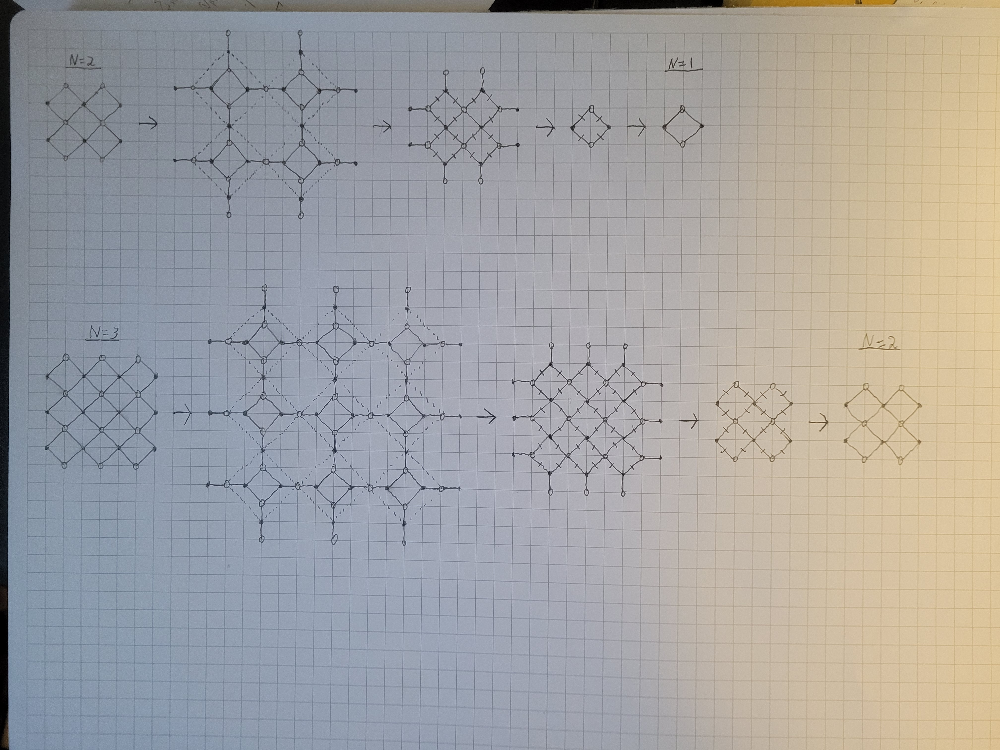

In [15]:
Image("figure.jpg")

## Domino Shuffling - Practice

First, I define the functions `aztec_vertices`, and `aztec_edges` to produce the vertex and edge sets for an order n Aztec Diamond. The function `neighbors` is used by the `aztec_edges` function to determine which vertices are adjacent, then edges are recorded as a tuple of points ordered by x coordinate.

In [3]:
def aztec_vertices(n):
    """
    Return the vertices for the order n Aztec diamond in Kasteleyn coordinates.
    """
    lower_half = [(j, 2*i-1-j) for i in range(1, n+1) for j in range(2*i)] # points below the line y=2n-x
    upper_half = [(2*n - y, 2*n - x) for x,y in lower_half] # reflect lower half over the line y=2n-x
    return lower_half + upper_half

def neighbors(vertex, n):
    """
    Return the neighbor vertices for the given vertex in an order n Aztec diamond.
    """
    x,y = vertex
    nebs = []
    if x > 0 and y > 0:
        nebs.append((x-1, y-1))
    if x > 0 and y < 2*n:
        nebs.append((x-1, y+1))
    if x < 2*n and y > 0:
        nebs.append((x+1, y-1))
    if x < 2*n and y < 2*n:
        nebs.append((x+1, y+1))
    return nebs

def aztec_edges(n):
    """
    Return the edge set for the order n Aztec diamond.
    The edges are of the form ((x1, y1), (x2, y2)) where x1 < x2.
    """
    verts = aztec_vertices(n)
    edges = set()
    for v1 in verts:
        for v2 in neighbors(v1, n):
            if v1[0] <= v2[0]:
                edges.add((v1, v2))
            else:
                edges.add((v2, v1))
    return list(edges)

The code below tests the `aztec_vertices` and `aztec_edges` functions by plotting the edges and vertices of order 1, 2 and 3 Aztec diamonds. The length of the edge sets are printed, to check that there are no duplicates.

Order 1 edge count: 4, vertex count: 4
Order 2 edge count: 16, vertex count: 12
Order 3 edge count: 36, vertex count: 24


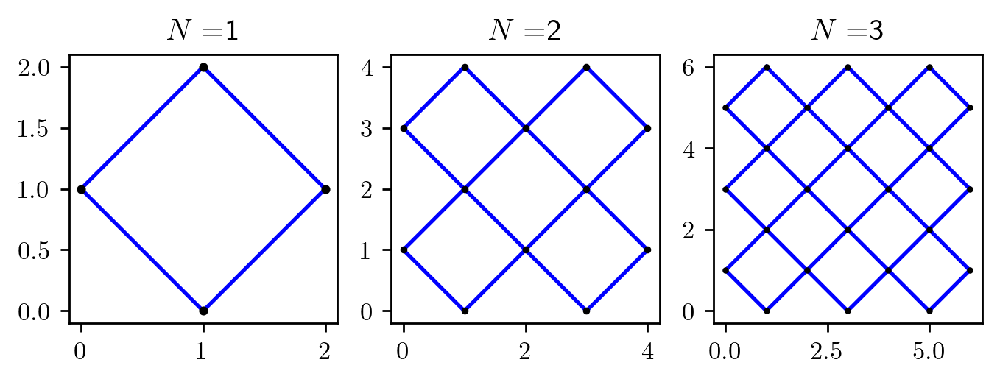

In [4]:
N_max = 3
fig, ax = plt.subplots(1, N_max)
for N in range(1, N_max+1):
    edges = aztec_edges(N)
    vertices = aztec_vertices(N)
    print("Order {} edge count: {}, vertex count: {}".format(N, len(edges), len(vertices)))
    for e in edges:
        ax[N-1].plot(*zip(*e), 'b')
    ax[N-1].plot(*zip(*vertices), '.', color='black', markersize=5/np.sqrt(N))
    ax[N-1].set_title("$N = $" + str(N))
    ax[N-1].set_aspect('equal')
plt.show()

The function `plot_matching` defined below plots the given perfect matching on the given matplotlib Axes object. The perfect matching is represented as a list of the edges of the matching, where each edge is a tuple of the vertices that comprise the edge, sorted by x component. The color of the edge is determined by the edges orientation (y1 > y2 is NW - SE), and the parity of x component of the first vertex.

In [5]:
def plot_matching(matching, ax):
    """
    Plot the given matching on the given axis.
    The matching should be an enumerable collection of edges of the form returned by aztec_edges.
    """
    for v1,v2 in matching:
        x1, y1 = v1
        x2, y2 = v2
        if y1 > y2: # NW - SE tile
            width = 2*np.sqrt(2)
            height = np.sqrt(2)
            color = 'y' if x1 % 2 == 0 else 'g'
        else: # NE - SW tile
            width = np.sqrt(2)
            height = 2*np.sqrt(2)
            color = 'r' if x1 %  2 == 0 else 'b'
        angle = -45
        anchor = (x1-1, y1)
        rect = mpl.patches.Rectangle(anchor,width,height,angle=angle,linewidth=1,facecolor=color)
        ax.add_patch(rect)
    ax.autoscale_view()
    ax.set_aspect('equal')
    ax.axis('off')
    return ax

The function `expand_matching` defined below is the actual implementation of the domino shuffling algorithm. The function `find_squares` is used to find the 2x2 squares that need to be filled after the edges have been moved. Unfortunately, this function returns squares that overlap. When filling the squares, we start with the left-most, then use the `overlap_squares` function to determine all squares that might overlap with the one we just filled, and remove those from consideration. Finally, the function `iterative_expand_matching` takes and initial matching and repeatedly applies the shuffling algorithm to it until the desired order is reached.

In [6]:
def find_squares(free_verts, free_edges):
    """
    Find the 2x2 squares to be filled in the expansion alg.
    Squares are identified by their left corner.
    """
    squares = []
    for x,y in free_verts:
        # Define required edges
        e1 = ((x,y), (x+1, y+1))
        e2 = ((x,y), (x+1, y-1))
        e3 = ((x+1,y+1), (x+2, y))
        e4 = ((x+1, y-1), (x+2, y))
        if all([e in free_edges for e in [e1, e2, e3, e4]]):
            squares.append((x,y))
    return squares

def overlap_squares(square):
    """
    For the given square, return all other squares that contain at least one vertex in common.
    """
    x,y = square
    return [(x+1, y+1), (x+1, y-1), (x-1, y+1), (x-1, y-1), (x+2, y), (x-2, y), (x, y+2), (x, y-2)]

def expand_matching(matching, N=None):
    """
    Apply one step of the domino shuffling algorithm to the given perfect matching.
    N is current order of the matching. If not given, it is determined from the vertices of the matching.
    """
    if N is None:
        N = int(np.array(matching).max() / 2) # determine current order
    new_matching = []

    # Move/delete edges
    for v1,v2 in matching:
        x1, y1 = v1
        x2, y2 = v2
        if y1 > y2:
            if x1 % 2 == 0:
                moved_edge = ((x1-1, y1-1), (x2-1, y2-1))
            else:
                moved_edge = ((x1+1, y1+1), (x2+1, y2+1))
        else:
            if x1 % 2 == 0:
                moved_edge = ((x1-1, y1+1), (x2-1, y2+1))
            else:
                moved_edge = ((x1+1, y1-1), (x2+1, y2-1))
        if not (moved_edge in matching):
            new_matching.append(moved_edge)

    # shift everything back to where it should be
    new_matching = [((v1[0]+1, v1[1]+1), (v2[0]+1, v2[1]+1)) for v1,v2 in new_matching]

    # Determine free vertices/edges in order to find squares
    full_edge_set = aztec_edges(N+1)
    full_vertex_set = aztec_vertices(N+1)
    free_vertex_set = [vert for vert in full_vertex_set if not any([vert in e for e in new_matching])]
    free_edge_set = [e for e in full_edge_set if e[0] in free_vertex_set and e[1] in free_vertex_set] 

    # find all available squares (identified by left corner, sorted by x value)
    squares = sorted(find_squares(free_vertex_set, free_edge_set), key=lambda x: x[0])
    
    # Fill in the rest of the diamond
    while len(free_edge_set) > 0:
        # take a square
        x,y = squares.pop()

        # randomly select orientation
        if np.random.rand() > 0.5:
            e1 = ((x, y), (x+1, y+1))
            e2 = ((x+1, y-1), (x+2, y))
        else:
            e1 = ((x,y), (x+1, y-1))
            e2 = ((x+1, y+1), (x+2, y))
        
        new_matching += [e1, e2]
        
        # update free vertex/edge sets
        free_edge_set = [e for e in free_edge_set if not ((e1[0] in e) or (e1[1] in e) or (e2[0] in e) or (e2[1] in e))]
        free_vertex_set = [v for v in free_vertex_set if not v in list(e1)+list(e2)]

        # update squares
        for sq in overlap_squares((x,y)):
            if sq in squares:
                squares.remove(sq)

    return new_matching

def iterative_expand_matching(matching, goal_N):
    """
    Iteratively apply the domino shuffling algorithm to the given matching until the goal order is reached.
    """
    N = int(np.array(matching).max() / 2) # determine current order
    for i in range(N, goal_N + 1):
        matching = expand_matching(matching, i)
    return matching

The code below tests the `plot_matching` and `expand_matching` functions by expanding the given order 2 matching up to order 4, and plotting both the matchings and the vertices for reference.

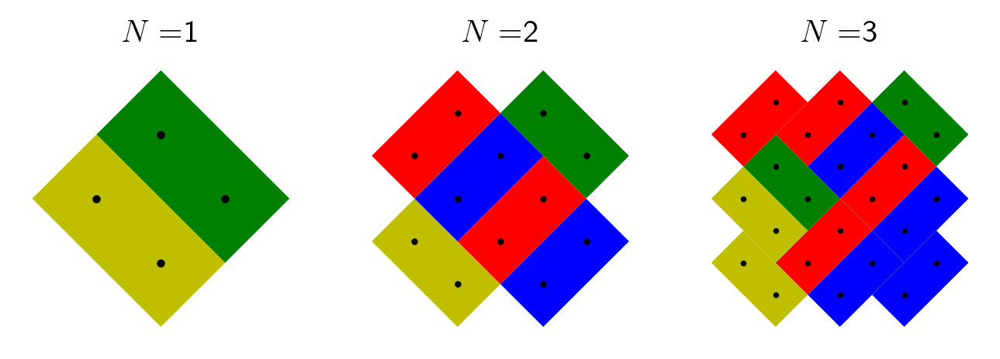

In [7]:
matching = [((0, 1), (1, 0)), ((1, 2), (2, 1))]
N_max = 3
fig, ax = plt.subplots(1, N_max)
for N in range(1, N_max+1):
    plot_matching(matching, ax[N-1])
    ax[N-1].plot(*zip(*aztec_vertices(N)), '.', color='black', markersize=4/np.sqrt(N))
    ax[N-1].set_title("$N = $" + str(N))
    matching = expand_matching(matching)
plt.show()

The code below uses the `iterative_expand_matching` function to generate a uniformly random order 100 Aztec diamond.

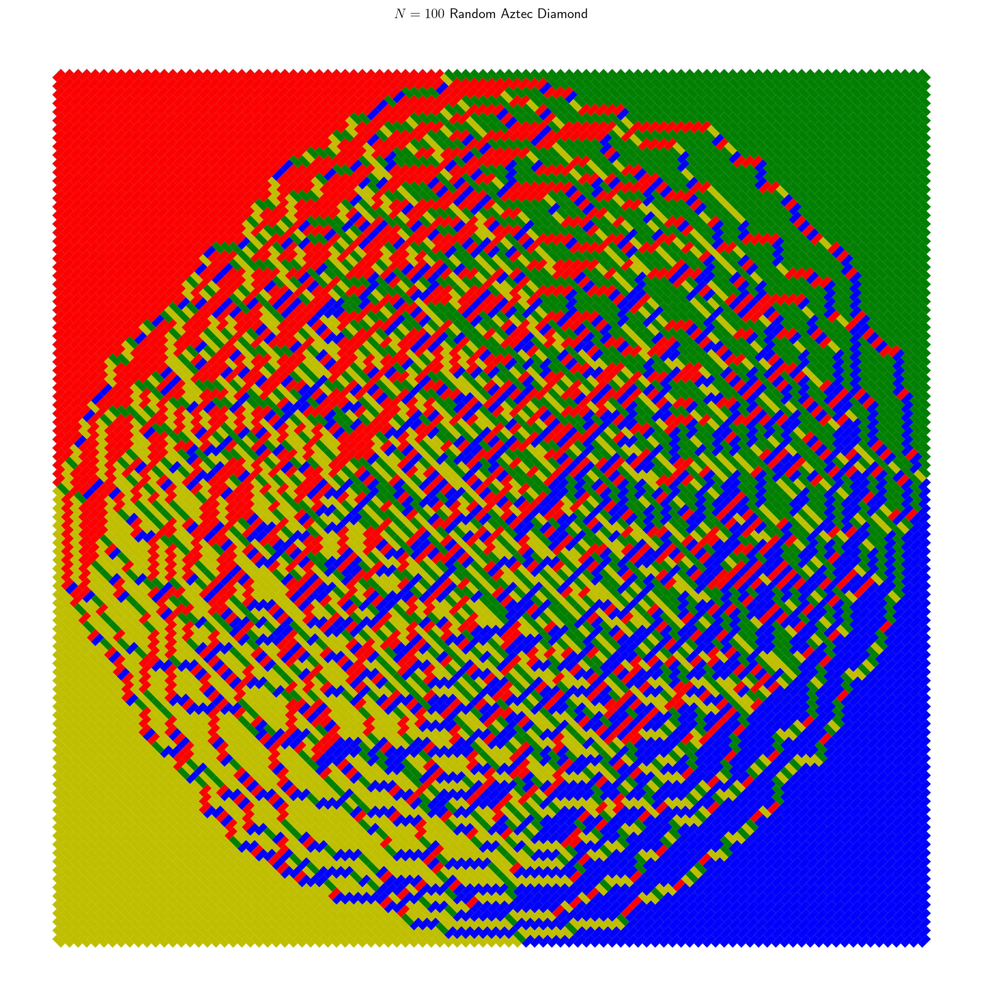

In [8]:
matching = [((0, 1), (1, 0)), ((1, 2), (2, 1))] if np.random.rand() > 0.5 else [((0,1), (1, 2)), ((1, 0), (2, 1))]
new_matching = iterative_expand_matching(matching, 100)
fig, ax = plt.subplots(figsize=(15,15))
ax = plot_matching(new_matching, ax)
ax.set_title("$N = 100$ Random Aztec Diamond")
plt.show()

## Coupling From the Past

The code below tests the `plot_plane_partition` function, which plots the given plane partition. The plane partition is simply represented as  $N\times N$ array weakly decreasing along rows and columns. The partition is plotted using a 3D box plot. The lighting/shading is a little screwy, but it works sufficiently well for present purposes.

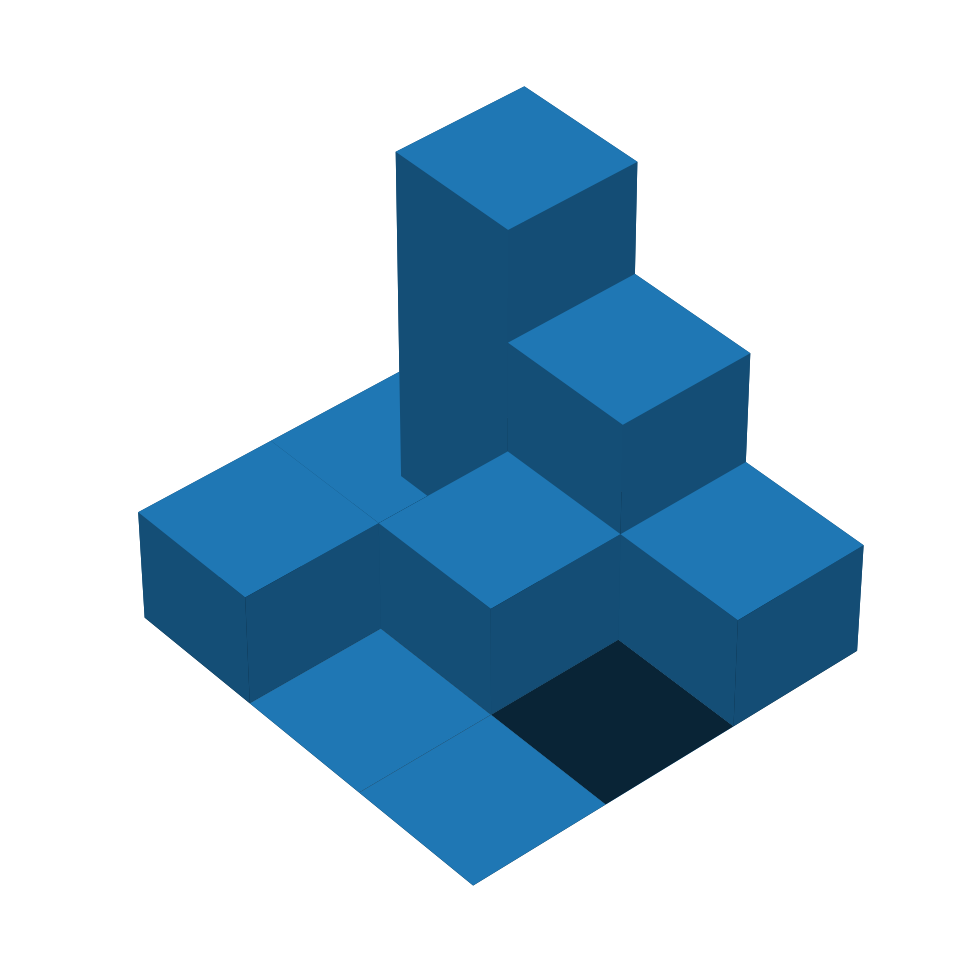

In [9]:
stack = [[3, 2, 1],
         [1, 1, 0],
         [1, 0, 0]]
stack = np.array(stack)

def plot_plane_partition(part):
    N = len(part)
    fig = plt.figure()
    ax = fig.add_subplot(projection='3d')
    xx, yy = np.meshgrid(np.arange(N), np.arange(N))
    x, y = xx.ravel(), yy.ravel()

    top = np.array(part).T.flatten()
    bottom = np.zeros_like(top)
    width = depth = 1

    ls = LightSource(azdeg=90, altdeg=89)

    ax.bar3d(x, y, bottom, width, depth, top, shade=True, lightsource=ls)
    ax.view_init(40, 49)
    ax.axis('off')

plot_plane_partition(stack)
plt.show()

The function `do_move` defined below is used to apply a 'move' to a give partition. A move is specified by a position `pos` from $0$ to $N^2-1$, and a height change `delta` $\in \{-1, 1\}$. If the move is valid (i.e. the new height is between $0$ and $N$, and the weakly decreasing order is maintained) `do_move` returns the partition with the move done, else it just returns the partition. The function `sample_plane_partition` uses coupling from the past to sample an order `N` plane partition uniformly at random. Starting with the minimal and maximal partitions, a random move is generated and applied to each partition. This is repeated until the partitions converge and the result is returned.

In [10]:
def do_move(partition, pos, delta):
    """
    Determine if the move defined by the given pos and delta can be performed on the given partition.
    If so, do the move and return the partition, else just return the partition.
    """
    N = len(partition)
    x = pos // N
    y = pos % N
    new_height = partition[x, y] + delta
    valid_height = 0 <= new_height and new_height <= N
    if x > 0:
        valid_height = valid_height and partition[x-1, y] >= new_height
    if x < N-1:
        valid_height = valid_height and new_height >= partition[x+1, y]
    if y > 0:
        valid_height = valid_height and partition[x, y-1] >= new_height
    if y < N-1:
        valid_height = valid_height and new_height >= partition[x, y+1]
    if valid_height:
        partition[x, y] += delta
    return partition

min_partition = lambda n: np.zeros((n,n))  # Minimum partition is all 0s
max_partition = lambda n: np.ones((n,n))*n # Maximum partition is all Ns

def sample_plane_partition(N):
    """
    Generate a uniformly random plane partition of order N.
    """
    upper_part = max_partition(N)
    lower_part = min_partition(N)
    while not np.array_equal(upper_part, lower_part):
        # Generate random move
        pos = np.random.randint(N**2)
        delta = np.random.randint(2)*2 - 1

        # Perform move on upper and lower partitions
        upper_part = do_move(upper_part, pos, delta)
        lower_part = do_move(lower_part, pos, delta)
    return upper_part

The code below uses the `sample_plane_partition` and `plot_plane_partition` functions to sample and plot and uniformly random order 20 plane partition.

Uniform Random Plane Partition:
20 20 20 20 20 20 20 20 20 19 19 19 18 18 18 18 17 11 09 08
20 20 20 20 20 20 19 19 19 19 18 17 17 15 12 12 12 11 09 08
20 20 20 20 20 20 19 19 19 19 18 17 17 15 12 12 10 08 07 03
20 20 20 20 20 20 19 19 19 17 17 17 13 11 10 10 09 08 06 03
20 20 20 20 20 20 19 18 16 14 14 14 13 11 09 09 08 06 06 03
20 20 20 20 20 19 18 16 15 14 14 13 13 10 09 09 08 06 03 01
20 19 19 19 19 19 17 16 15 11 11 10 09 08 07 07 07 05 02 01
20 19 19 19 19 19 17 14 12 11 11 09 09 08 07 07 04 04 02 00
20 19 19 19 19 18 17 13 12 11 11 09 09 08 07 06 04 02 01 00
20 19 19 19 18 18 16 13 12 10 08 08 08 08 06 06 03 02 01 00
19 19 19 19 16 15 12 12 10 08 08 08 06 06 06 06 03 01 01 00
19 19 19 19 15 15 12 12 09 08 07 06 06 05 04 04 02 01 01 00
19 19 18 16 14 10 10 09 07 07 06 06 05 05 04 02 02 01 01 00
19 19 17 16 10 10 10 08 07 06 05 04 04 04 04 02 02 01 01 00
17 17 13 13 10 08 07 06 05 04 04 03 03 03 03 01 01 01 01 00
17 14 10 10 09 08 07 06 05 04 04 03 03 03 03 01 01 01 01 00
16 10 10

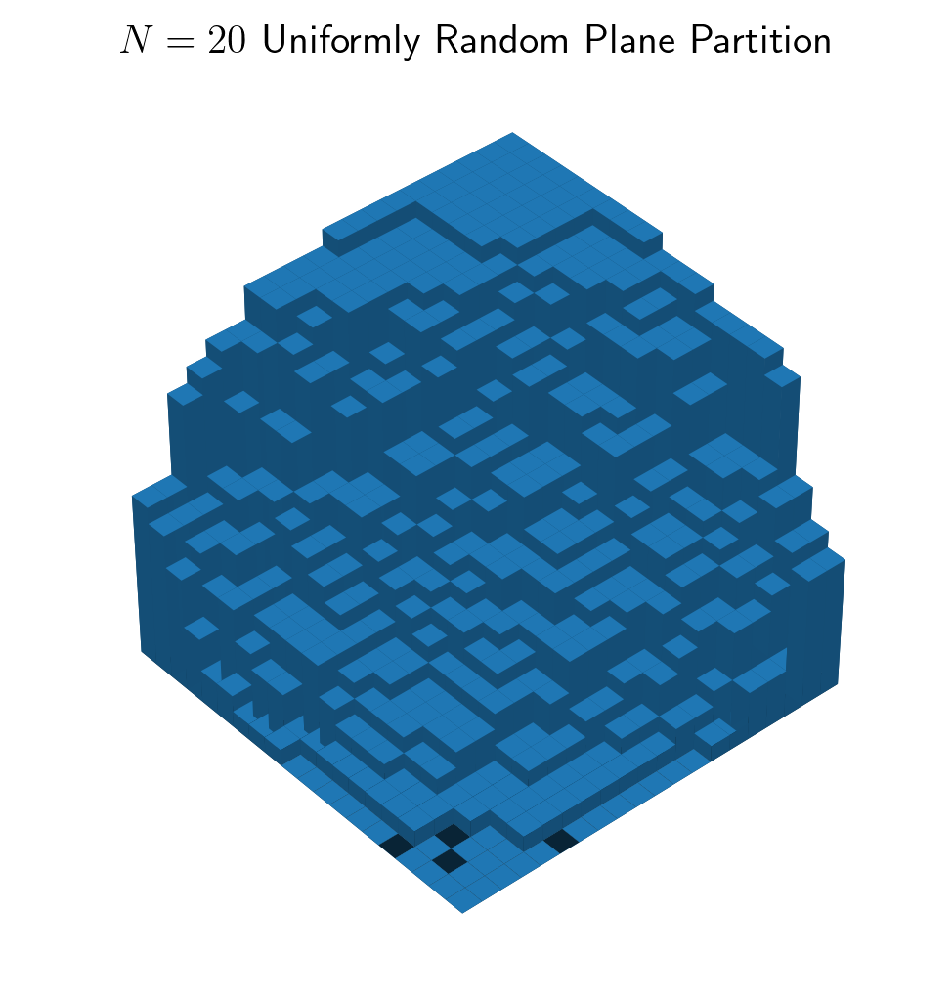

In [11]:
N = 20
partition = sample_plane_partition(N)
print("Uniform Random Plane Partition:")
for i in range(N):
    print(" ".join(["{:02d}".format(int(h)) for h in partition[i]]))
    
plot_plane_partition(partition)
plt.title("$N = 20$ Uniformly Random Plane Partition")
plt.show()